<a href="https://colab.research.google.com/github/klajdikaciu/ComputerVision/blob/main/Excercise1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

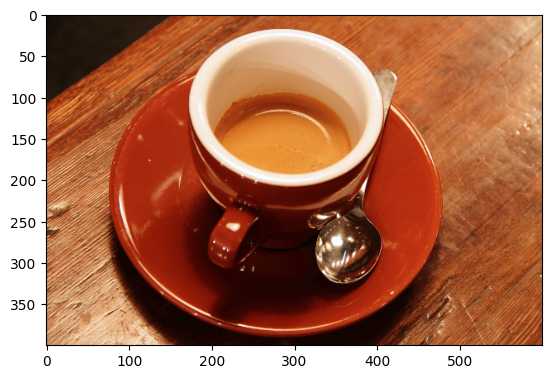

In [1]:
from skimage import data
import matplotlib.pyplot as plt

coffee_image = data.coffee()
plt.imshow(coffee_image)
plt.show()

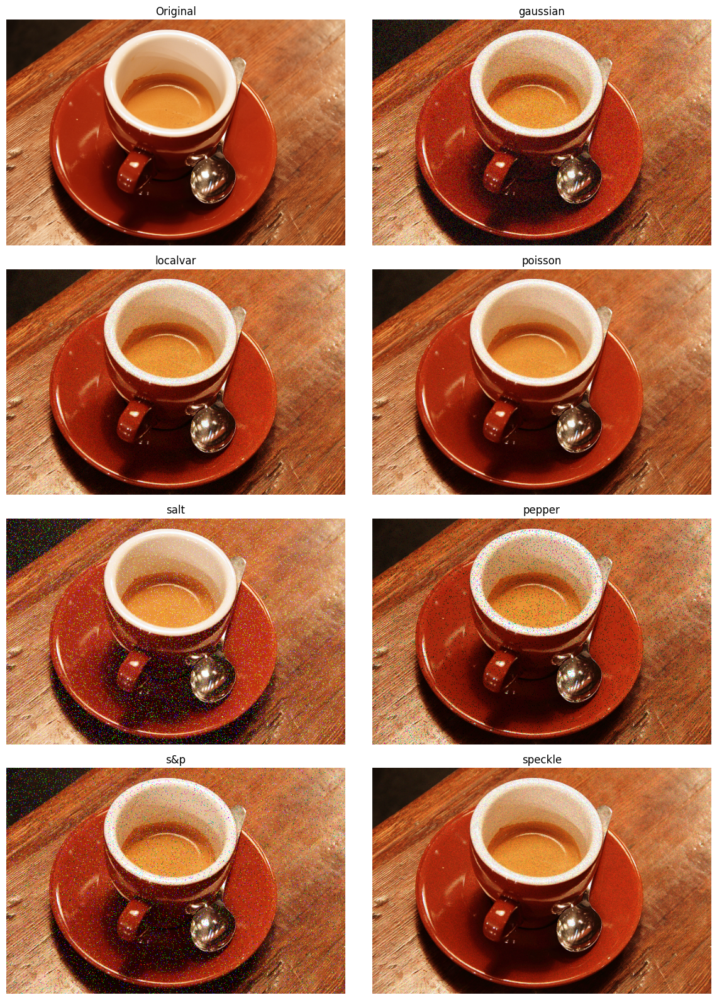

In [2]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise
import numpy as np


noise_types = [
    'gaussian',
    'localvar',
    'poisson',
    'salt',
    'pepper',
    's&p',
    'speckle'
]


fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes = axes.ravel()

axes[0].imshow(coffee_image)
axes[0].set_title('Original')
axes[0].axis('off')

for i, noise in enumerate(noise_types, start=1):
    if noise == 'localvar':
        epsilon = 1e-5
        local_variance = 0.01 * (coffee_image / 255.0) + epsilon
        noisy = random_noise(coffee_image, mode=noise, local_vars=local_variance)
    else:
        noisy = random_noise(coffee_image, mode=noise)

    axes[i].imshow(noisy)
    axes[i].set_title(noise)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

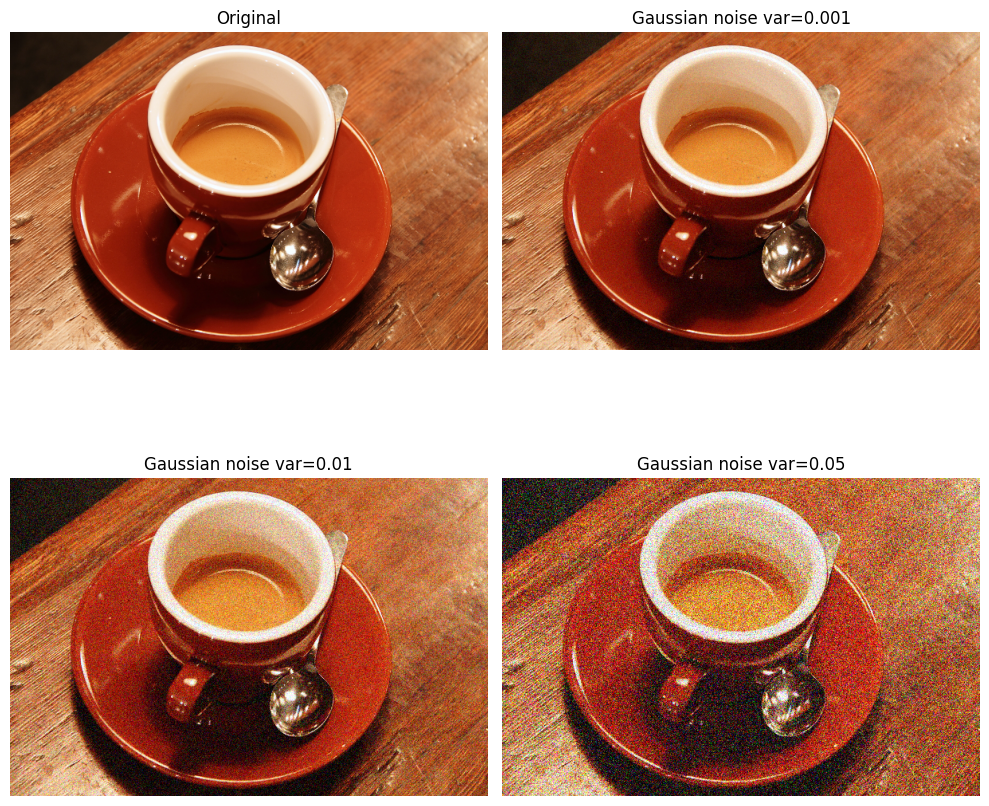

In [3]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise

variances = [0.001, 0.01, 0.05]

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.ravel()

axes[0].imshow(coffee_image)
axes[0].set_title('Original')
axes[0].axis('off')

for i, var in enumerate(variances, start=1):
    noisy_img = random_noise(coffee_image, mode='gaussian', var=var)
    axes[i].imshow(noisy_img)
    axes[i].set_title(f'Gaussian noise var={var}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

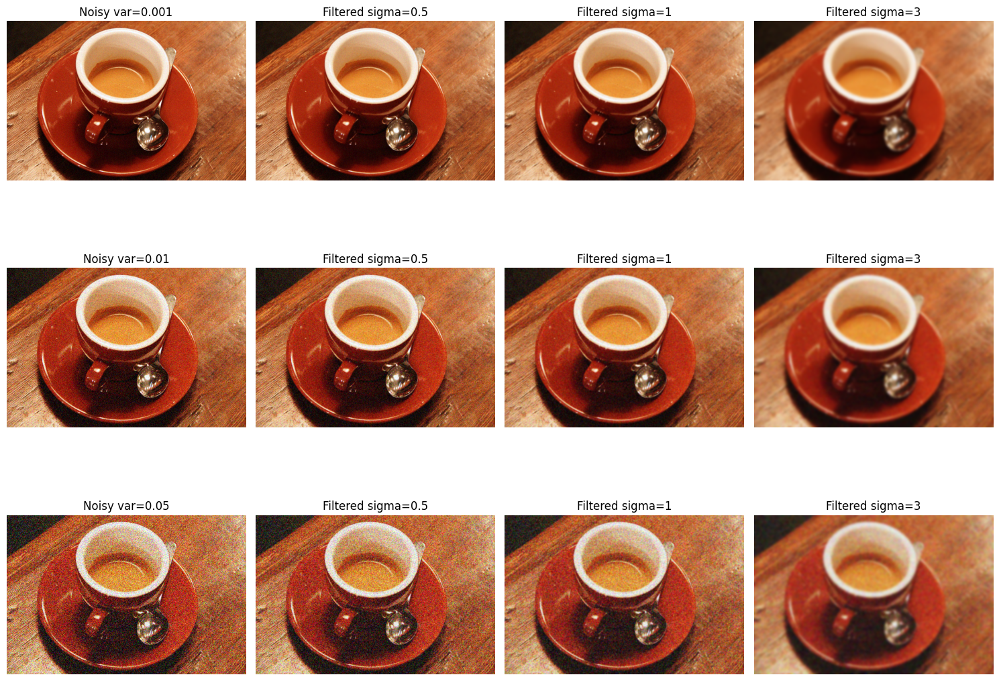

In [4]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise
from skimage.filters import gaussian

coffee_image = data.coffee()

variances = [0.001, 0.01, 0.05]

sigmas = [0.5, 1, 3]

noisy_images = [random_noise(coffee_image, mode='gaussian', var=v) for v in variances]

fig, axes = plt.subplots(len(variances), len(sigmas) + 1, figsize=(15, 12))

for row, (var, noisy_img) in enumerate(zip(variances, noisy_images)):

    axes[row, 0].imshow(noisy_img)
    axes[row, 0].set_title(f'Noisy var={var}')
    axes[row, 0].axis('off')


    for col, sigma in enumerate(sigmas, start=1):
        filtered_img = gaussian(noisy_img, sigma=sigma, channel_axis=-1)
        axes[row, col].imshow(filtered_img)
        axes[row, col].set_title(f'Filtered sigma={sigma}')
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()

Fraction of image corresponding to edges: 0.1504
Fraction of image corresponding to bricks (non-edges): 0.8496


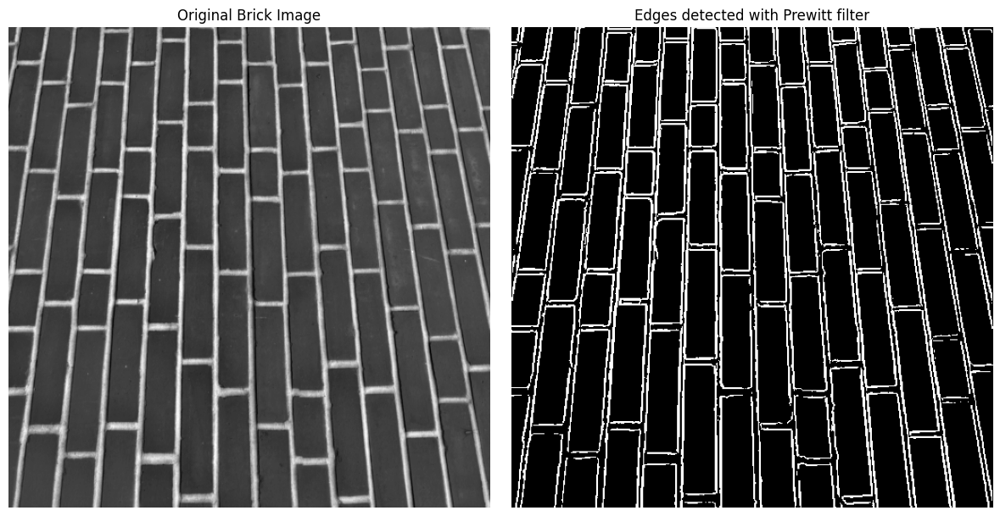

In [5]:
import matplotlib.pyplot as plt
from skimage import data, filters
import numpy as np

bricks = data.brick()

edges = filters.prewitt(bricks)

threshold = 0.1
edges_binary = edges > threshold

total_pixels = edges_binary.size
edge_pixels = np.sum(edges_binary)
brick_pixels = total_pixels - edge_pixels

fraction_edges = edge_pixels / total_pixels
fraction_bricks = brick_pixels / total_pixels

print(f"Fraction of image corresponding to edges: {fraction_edges:.4f}")
print(f"Fraction of image corresponding to bricks (non-edges): {fraction_bricks:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(bricks, cmap='gray')
axes[0].set_title('Original Brick Image')
axes[0].axis('off')

axes[1].imshow(edges_binary, cmap='gray')
axes[1].set_title('Edges detected with Prewitt filter')
axes[1].axis('off')

plt.tight_layout()
plt.show()


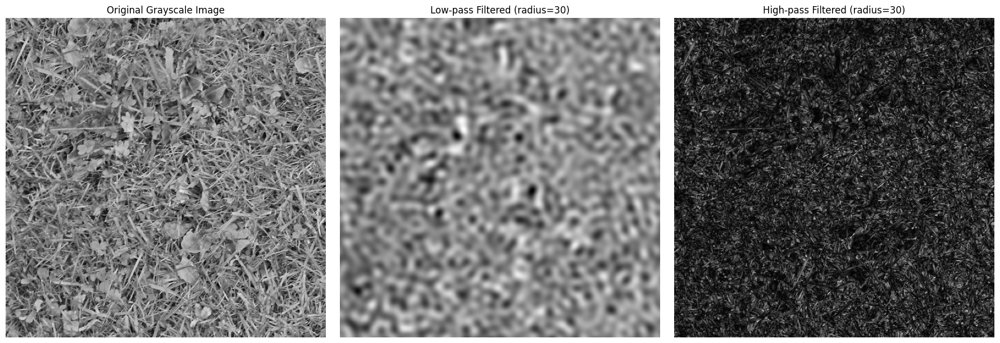

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data
from numpy.fft import fft2, ifft2, fftshift, ifftshift

grass = data.grass()

F = fft2(grass)
F_shifted = fftshift(F)

rows, cols = grass.shape
crow, ccol = rows // 2, cols // 2

radius = 30
Y, X = np.ogrid[:rows, :cols]
distance = np.sqrt((X - ccol)**2 + (Y - crow)**2)
low_pass_mask = np.zeros_like(grass)
low_pass_mask[distance <= radius] = 1

high_pass_mask = 1 - low_pass_mask

F_low = F_shifted * low_pass_mask
F_high = F_shifted * high_pass_mask

img_low = np.abs(ifft2(ifftshift(F_low)))
img_high = np.abs(ifft2(ifftshift(F_high)))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(grass, cmap='gray')
axes[0].set_title('Original Grayscale Image')
axes[0].axis('off')

axes[1].imshow(img_low, cmap='gray')
axes[1].set_title(f'Low-pass Filtered (radius={radius})')
axes[1].axis('off')

axes[2].imshow(img_high, cmap='gray')
axes[2].set_title(f'High-pass Filtered (radius={radius})')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Number of erosions to remove all blobs: 4


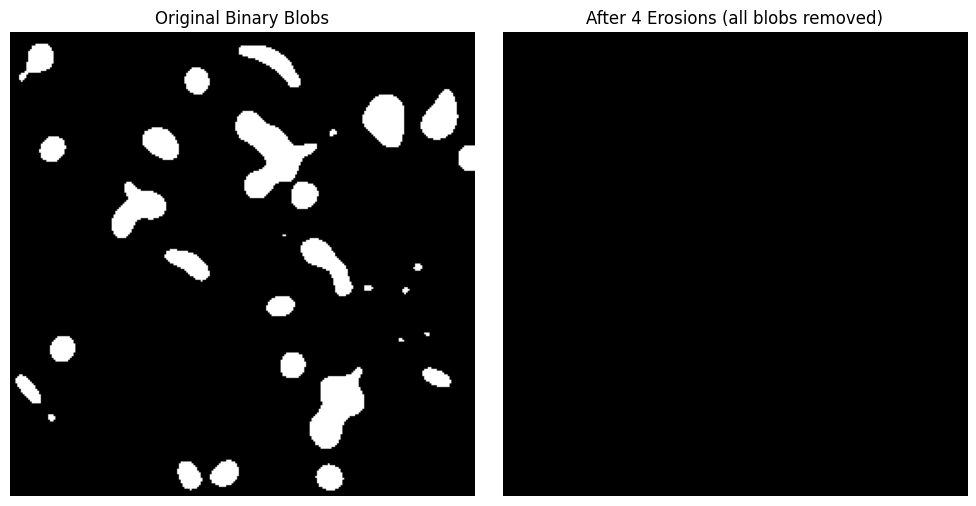

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk

np.random.seed(1)

blobs = binary_blobs(length=256, volume_fraction=0.1)

selem = disk(3)

eroded_img = blobs.copy()
count = 0

while np.any(eroded_img):
    eroded_img = erosion(eroded_img, selem)
    count += 1

print(f"Number of erosions to remove all blobs: {count}")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(blobs, cmap='gray')
axes[0].set_title('Original Binary Blobs')
axes[0].axis('off')

axes[1].imshow(eroded_img, cmap='gray')
axes[1].set_title(f'After {count} Erosions (all blobs removed)')
axes[1].axis('off')

plt.tight_layout()
plt.show()